**MATH 317 - Lab Assignment 4** <br>
**Due: Wednesday, November 29, 2023** <br>
**Skylar Bitar (261050625)**

In [294]:
# Preamble
import numpy as np
import matplotlib.pyplot as plt

# Generates Y values according to assignment instructions
def DataSet(F, x, e): 
    return F(x) + e

# Ensures no crashing when taking logs
def safe_log(x): 
    x = np.array(x) 
    x[x < 1e-16] = 1e-16
    return np.log(x)

# Activation Function
def sigmoid(x):
    return (1/(1 + np.exp(-x)))

# Loss Function - Least Squares
def loss_function(y_predicted, y_actual):
    return (1/2)*np.sum((y_predicted-y_actual)**2)

# Functions to be used throughout assignment
def F1(x): 
    return np.exp(x)

def F2(x):
    return (x + np.abs(x))/(2*x)

def F3(x):
    return np.sin(30*x) + np.cos(27*x)

def F4(x):
    return np.sin(1/(1.02-x))

def F5(x):
    return np.exp(x)/np.pi

errorTolerance = 0.1 # This will set our error tolerance when generating data sets
learning_rates = [0.0001, 0.001, 0.01] # These will be our different values of stepsize
N1, N2 = 20, 40

# Generate X-Values to be used in training sets
np.random.seed(3)
x1_train = np.random.uniform(-1, 1, N1)
e1_train = np.random.normal(0, errorTolerance, N1)

np.random.seed(3)
x2_train = np.random.uniform(-1, 1, N2)
e2_train = np.random.normal(0, errorTolerance, N2)

# Generate Y-Values to be used in test sets
np.random.seed(3)
x1_test = np.random.uniform(-1, 1, int(np.round(N1/4)))
e1_test = np.random.normal(0, errorTolerance, int(np.round(N1/4)))

np.random.seed(3)
x2_test = np.random.uniform(-1, 1, int(np.round(N2/4)))
e2_test = np.random.normal(0, errorTolerance, int(np.round(N2/4)))

1. Implement the linear regression $f(x) = ax + b$. Choose the target function F to be <br>
$F(x) = exp(x)$, <br>
and train it by the plain gradient descent. The exact values of the regression parameters (a, b) can be found by simple linear algebra, which can then be subtracted from the gradient descent steps ($a_n, b_n$) to compute the parametric error. Plot the parametric error, the training loss, as well as the test loss against the number of gradient descent steps for different values of the stepsize η (or the learning rate). Make a contour plot of the training loss as a function of (a, b) and depict the path of the gradient descent algorithm for different values of the learning rate and for different initial values ($a_0,b_0$). Perform experiments to see how the size of the training data set affects the quality
of the regression.

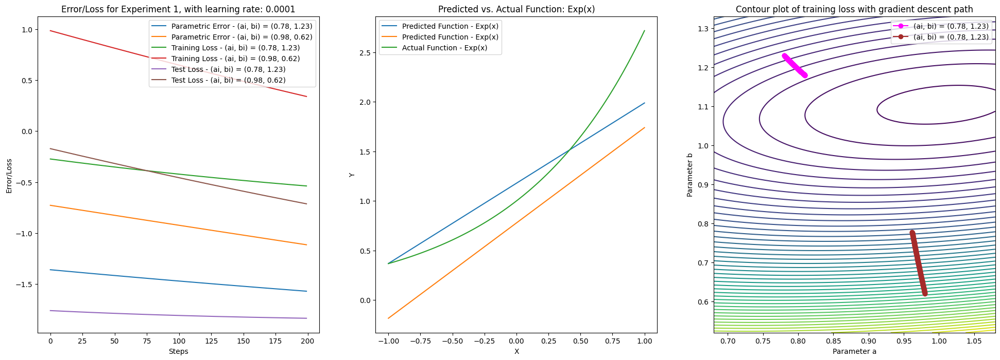

<Figure size 640x480 with 0 Axes>

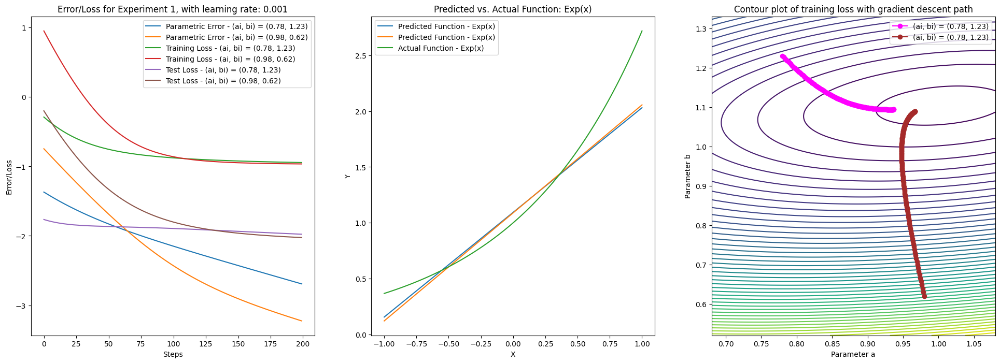

<Figure size 640x480 with 0 Axes>

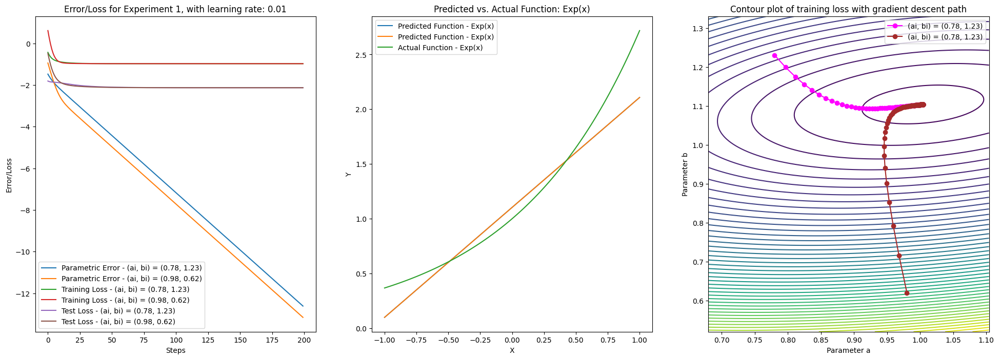

<Figure size 640x480 with 0 Axes>

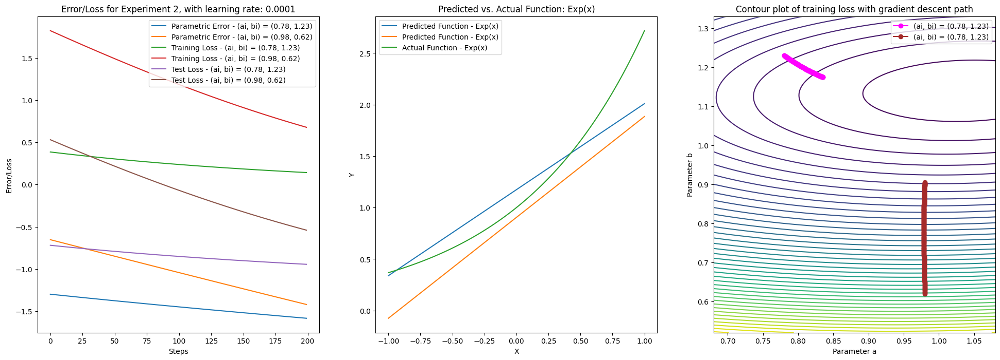

<Figure size 640x480 with 0 Axes>

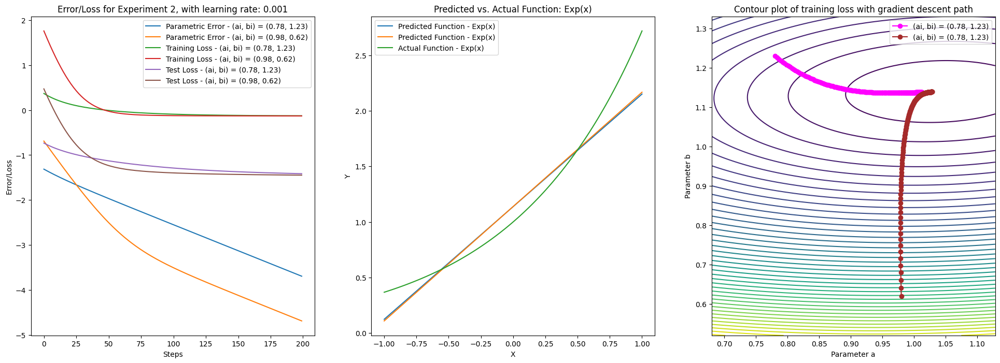

<Figure size 640x480 with 0 Axes>

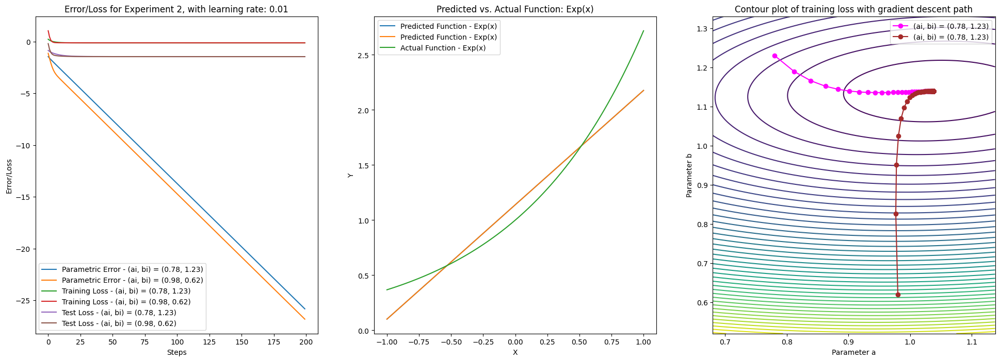

<Figure size 640x480 with 0 Axes>

In [363]:
def linear_gradient(x, y, a, b, wrt):
    if wrt == 'a': # If taking the gradient(partial derivative) with respect to a, do this
        return np.sum(((a*x + b) - y) * x)
    elif wrt == 'b': # Else if taking it with respect to b, do this
        return np.sum((a*x + b) - y)

def calculate_true_parameters(experiment):
    # This gives us the actual values for a and b.
    # I use the following formulas:
    # a = sum((x - mean(x)) * (y - mean(y))) / sum((x - mean(x))**2)
    # b = mean(y) - a*mean(x)
    meanX, meanY = np.mean(experiment[0][0]), np.mean(experiment[0][1]) 
    
    a = np.sum((experiment[0][0] - meanX) * (experiment[0][1] - meanY))/ np.sum((experiment[0][0] - meanX)**2)
    b = meanY - a * meanX

    return a, b

def plain_descent(a0, b0, experiment, learning_rate, type, iterations):
    # Here we extract all the necessary information from the input experiment
    a, b = a0, b0
    x, y = experiment[0][0], experiment[0][1]
    x_test, y_test = experiment[1][0], experiment[1][1]
    ta, tb = calculate_true_parameters(experiment)

    # Here we initialize the arrays to store errors and parameter trajectories.
    parametric_error, training_loss, test_loss = [], [], []
    pa, pb = [a], [b]
    
    for _ in range(iterations): 
        # Here we update the parameters using the formula (a_n, b_n) -= rate * grad(A, B)
        a -= learning_rate * type(x, y, a, b, 'a') 
        b -= learning_rate * type(x, y, a, b, 'b')

        # We append the combined parametric error of a and b to the array 
        parametric_error.append(np.sqrt(np.abs(tb - b)**2 + np.abs(ta - a)**2))

        # The inner portion of the loss depends on the type of regression we are using
        # This general version allows us to reuse the function for q2
        if (type == linear_gradient): # This is what we need for this question
            training_loss.append(loss_function(a*x+b, y))
            test_loss.append(loss_function(a*x_test+b, y_test))
        elif (type == logistic_gradient): # And this is what we need for question 2 and 3
            training_loss.append(loss_function(sigmoid(a*x+b), y))
            test_loss.append(loss_function(sigmoid(a*x_test+b), y_test))

        # And we append the current predictions for the parameters
        pa.append(a)
        pb.append(b)

    return pa, pb, parametric_error, training_loss, test_loss

experiments = [] # Here we store the experiments we will be using (they have different sizes)
experiments.append(((x1_train, DataSet(F1, x1_train, e1_train)), (x1_test, DataSet(F1, x1_test, e1_test))))
experiments.append(((x2_train, DataSet(F1, x2_train, e2_train)), (x2_test, DataSet(F1, x2_test, e2_test))))

i = 1
for experiment in experiments:
    for rate in learning_rates:
        # We perform plain descent on each experiment with each learning rate, each with 2 (a0,b0)
        pa1, pb1, perror1, tr_loss1, te_loss1 = plain_descent(0.78, 1.23, experiment, rate, linear_gradient, 200)
        pa2, pb2, perror2, tr_loss2, te_loss2 = plain_descent(0.98, 0.62, experiment, rate, linear_gradient, 200)
        
        steps = range(200) # We define this to easily plot against gradient steps

        # We create subplots to easily view the necessary plots for each experiment + learning rate
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns
        
        # Here we plot the various error functions against each other
        ax1.plot(steps, safe_log(perror1), label='Parametric Error - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(perror2), label='Parametric Error - (ai, bi) = (0.98, 0.62)')
        ax1.plot(steps, safe_log(tr_loss1), label='Training Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(tr_loss2), label='Training Loss - (ai, bi) = (0.98, 0.62)')
        ax1.plot(steps, safe_log(te_loss1), label='Test Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(te_loss2), label='Test Loss - (ai, bi) = (0.98, 0.62)')
        ax1.set_xlabel('Steps')
        ax1.set_ylabel('Error/Loss')
        ax1.set_title('Error/Loss for Experiment ' + str(i) + ', with learning rate: ' + str(rate))
        ax1.legend()

        # Here we plot the true function vs. our predicted function 
        x_values = np.linspace(-1, 1, 100) 
        ax2.plot(x_values, pa1[len(pa1)-1]*x_values + pb1[len(pb1)-1], label='Predicted Function - Exp(x)')
        ax2.plot(x_values, pa2[len(pa2)-1]*x_values + pb2[len(pb2)-1], label='Predicted Function - Exp(x)')
        ax2.plot(x_values, F1(x_values), label='Actual Function - Exp(x)')
        ax2.set_xlabel('X')
        ax2.set_ylabel('Y')
        ax2.set_title('Predicted vs. Actual Function: Exp(x)')
        ax2.legend()

        # To create an accurate contour grid, we will create a meshgrid that 
        # is bounded by the max and min a,b values found in all 3 experiments 
        A, B = np.meshgrid(np.linspace(min(min(pa1), min(pa2)) - 0.1, max(max(pa1), max(pa2)) + 0.1, len(pa1)), 
                   np.linspace(min(min(pb1), min(pb2)) - 0.1, max(max(pb1), max(pb2)) + 0.1, len(pa1)))

        # We find what the loss function of the experiment is to make the contour plot as a function of it
        Z = np.array([[loss_function(a_val*experiment[0][0] + b_val, experiment[0][1])
                       for a_val, b_val in zip(a_row, b_row)] 
                      for a_row, b_row in zip(A, B)])

        # To visualize our data, we plot with varying aesthetics
        ax3.contour(A, B, Z, levels=50, cmap='viridis')
        ax3.plot(pa1, pb1, color='magenta', marker='o', label='(ai, bi) = (0.78, 1.23)')
        ax3.plot(pa2, pb2, color='brown', marker='o', label='(ai, bi) = (0.98, 0.62)')
        
        plt.xlabel('Parameter a')
        plt.ylabel('Parameter b')
        plt.title('Contour plot of training loss with gradient descent path')
        plt.legend()
        plt.show()

        plt.tight_layout()
        plt.show()
    i += 1 # Easily updates experiment number in titles

**<u>Discussion:</u>** <br> Notice that for both learning rate and size of data set, increasing either (or both parameter) leads to closer convergence, quicker convergence, and a more accurate approximation of the function. This can be noticed by looking at the jump in adjacent points in the contour plot along with examining the predicted vs. actual function graph within a given set. As for the error graphs, we notice that the training loss is higher than the test loss. This can likely be attributed to the fact that we are using a linear function to approximate a non-linear function. Regardless, all forms of loss are decreasing over time, which indicates that the accuracy is increasing with further gradient descent steps.

2. Implement the logistic regression f(x) = σ(ax + b). Choose F to be the step function <br>
F(x) = $\frac{x + |x|}{2x}$
and train it by the plain gradient descent. Plot the training loss and the test loss against the number of gradient descent steps for different values of the leaning rate. Make a contour plot of the training loss as a function of (a, b) and depict the path of the gradient descent algorithm for different values of the learning rate and for different initial values ($a_0, b_0$). Perform experiments to see how the size of the training data set affects the quality of the regression.

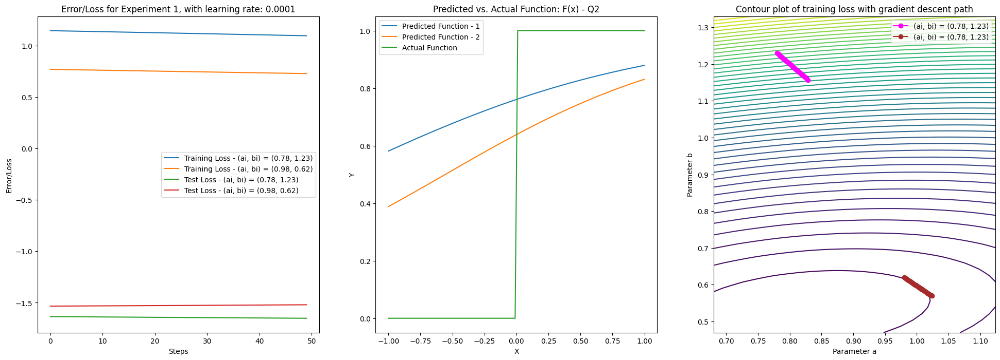

<Figure size 640x480 with 0 Axes>

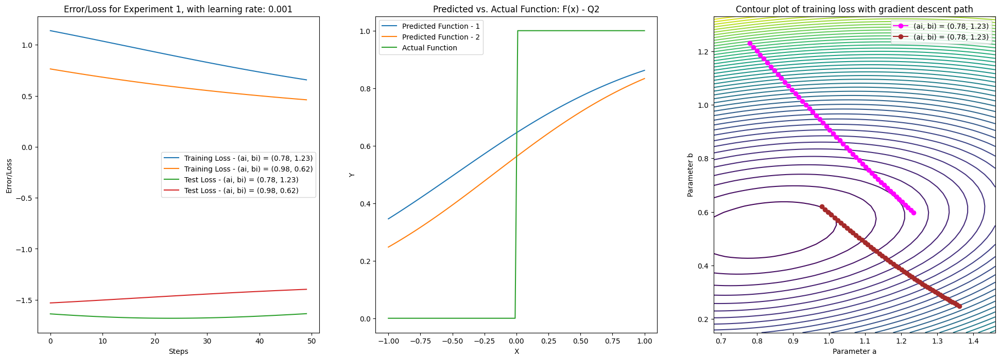

<Figure size 640x480 with 0 Axes>

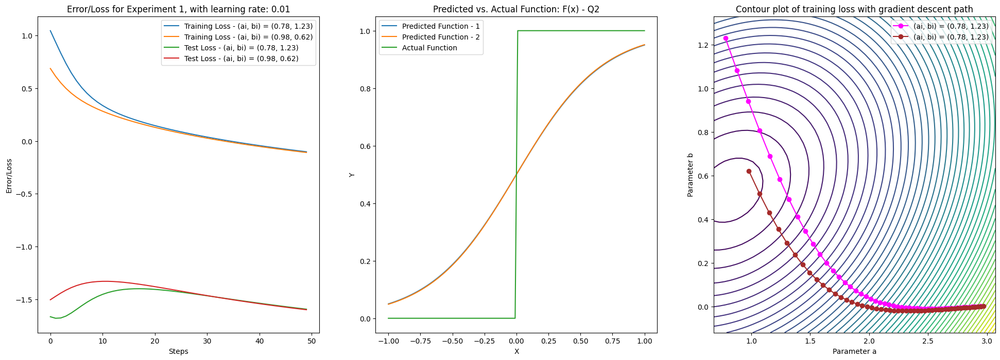

<Figure size 640x480 with 0 Axes>

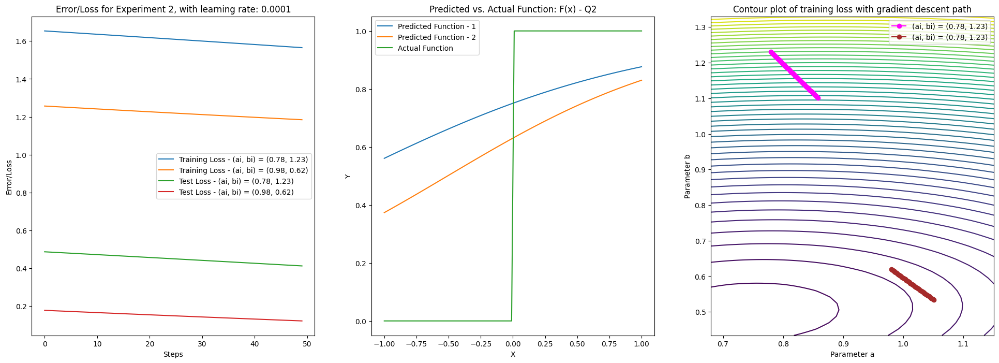

<Figure size 640x480 with 0 Axes>

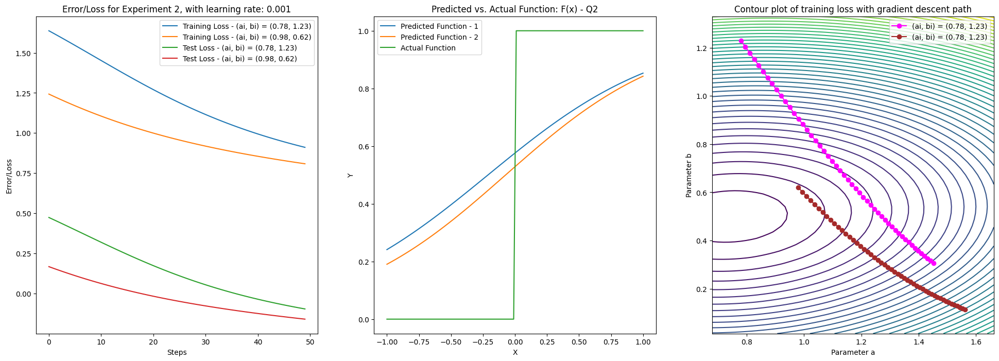

<Figure size 640x480 with 0 Axes>

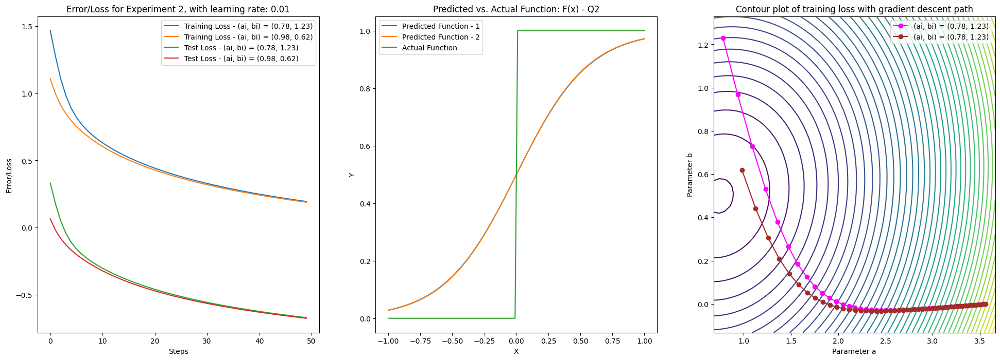

<Figure size 640x480 with 0 Axes>

In [365]:
def logistic_gradient(x, y, a, b, wrt): 
    # These are the gradients we need for logisitc regression
    sig = sigmoid(a*x+b)
    if wrt == 'a':
        return np.sum((sig - y)*((sig*(1-sig))*x))
    elif wrt == 'b':
        return np.sum((sig - y)*((sig*(1-sig))))

experiments = [] # We preload our experiments like before
experiments.append(((x1_train, DataSet(F2, x1_train, e1_train)), (x1_test, DataSet(F2, x1_test, e1_test))))
experiments.append(((x2_train, DataSet(F2, x2_train, e2_train)), (x2_test, DataSet(F2, x2_test, e2_test))))

i = 1
for experiment in experiments:
    for rate in learning_rates: 
        # We will need fewer iterations here as there is infinite convergence (explained in discussion)
        pa1, pb1, perror1, tr_loss1, te_loss1 = plain_descent(0.78, 1.23, experiment, rate*10, logistic_gradient, 50)
        pa2, pb2, perror2, tr_loss2, te_loss2 = plain_descent(0.98, 0.62, experiment, rate*10, logistic_gradient, 50)
        
        steps = range(50)

        # We create subplots to easily view the necessary plots for each experiment + learning rate
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns
        
        # Here we plot the various error functions against each other
        ax1.plot(steps, safe_log(tr_loss1), label='Training Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(tr_loss2), label='Training Loss - (ai, bi) = (0.98, 0.62)')
        ax1.plot(steps, safe_log(te_loss1), label='Test Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(te_loss2), label='Test Loss - (ai, bi) = (0.98, 0.62)')
        ax1.set_xlabel('Steps')
        ax1.set_ylabel('Error/Loss')
        ax1.set_title('Error/Loss for Experiment ' + str(i) + ', with learning rate: ' + str(rate))
        ax1.legend()

        # Here we plot the true function vs. our predicted function 
        x_values = np.linspace(-1, 1, 100) 
        ax2.plot(x_values, sigmoid(pa1[len(pa1)-1]*x_values + pb1[len(pb1)-1]), label='Predicted Function - 1')
        ax2.plot(x_values, sigmoid(pa2[len(pa2)-1]*x_values + pb2[len(pb2)-1]), label='Predicted Function - 2')
        ax2.plot(x_values, F2(x_values), label='Actual Function')
        ax2.set_xlabel('X')
        ax2.set_ylabel('Y')
        ax2.set_title('Predicted vs. Actual Function: F(x) - Q2')
        ax2.legend()

        # To create an accurate contour grid, we will create a meshgrid that 
        # is bounded by the max and min a,b values found in all 3 experiments 
        A, B = np.meshgrid(np.linspace(min(min(pa1), min(pa2)) - 0.1, max(max(pa1), max(pa2)) + 0.1, len(pa1)), 
                   np.linspace(min(min(pb1), min(pb2)) - 0.1, max(max(pb1), max(pb2)) + 0.1, len(pa1)))

        # We find what the loss function of the experiment is to make the contour plot as a function of it
        Z = np.array([[loss_function(a_val*experiment[0][0] + b_val, experiment[0][1])
                       for a_val, b_val in zip(a_row, b_row)] 
                      for a_row, b_row in zip(A, B)])

        # To visualize our data, we plot with varying aesthetics
        ax3.contour(A, B, Z, levels=50, cmap='viridis')
        ax3.plot(pa1, pb1, color='magenta', marker='o', label='(ai, bi) = (0.78, 1.23)')
        ax3.plot(pa2, pb2, color='brown', marker='o', label='(ai, bi) = (0.98, 0.62)')
        
        plt.xlabel('Parameter a')
        plt.ylabel('Parameter b')
        plt.title('Contour plot of training loss with gradient descent path')
        plt.legend()
        plt.show()

        plt.tight_layout()
        plt.show()
    i += 1

**<u>Discussion:</u>** <br> Here, we see a similar trend as Q1, where learning rate and data set size increases, lead to more accurate approximations of the function and better convergence. However, notice here that we have infinite convergence in the contour plot. As discussed on the forums, this is likely because it achieves quite good state early on and stagnates afterwards. That said, as we can see our errors are still decreasing overtime (indicating that it is learning with each further gradient step), and our approximation begins resembling our expectations (for the experiments with learning rate 0.01).

3. We repeat the previous exercise with some gradient descent variants. You may change the target function F if you find it boring. The variants of gradient descent we consider are: stochastic gradient descent, and at least one of the following: momentum, Nesterov, Adagrad, Adadelta, RMSprop, Adam, AdaMax, and Nadam. The descriptions of these algorithms including pointers to further reading are given in a paper by S. Ruder uploaded to MyCourses.

**Stochastic Descent:**

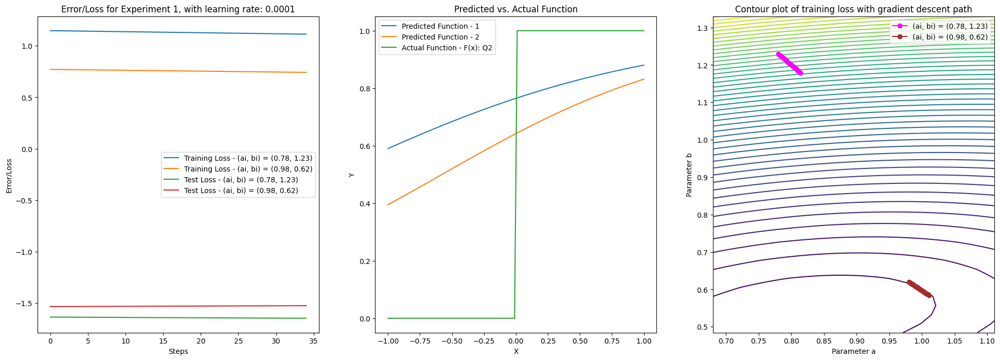

<Figure size 640x480 with 0 Axes>

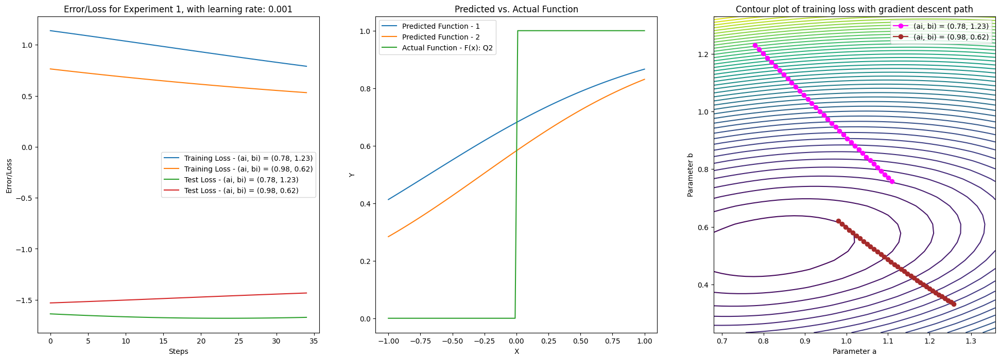

<Figure size 640x480 with 0 Axes>

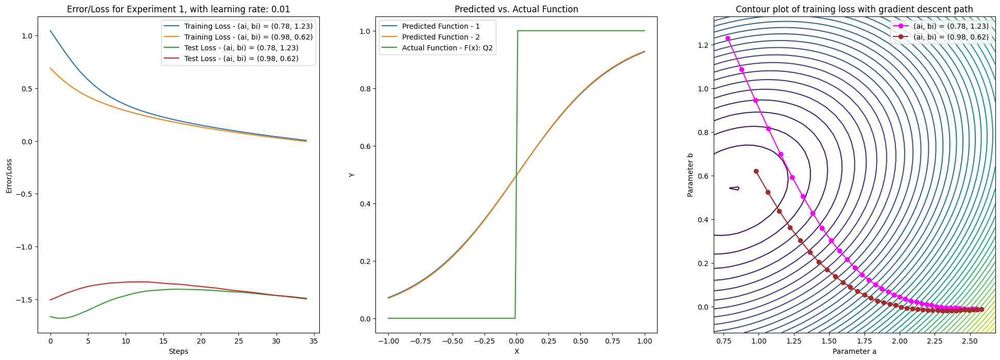

<Figure size 640x480 with 0 Axes>

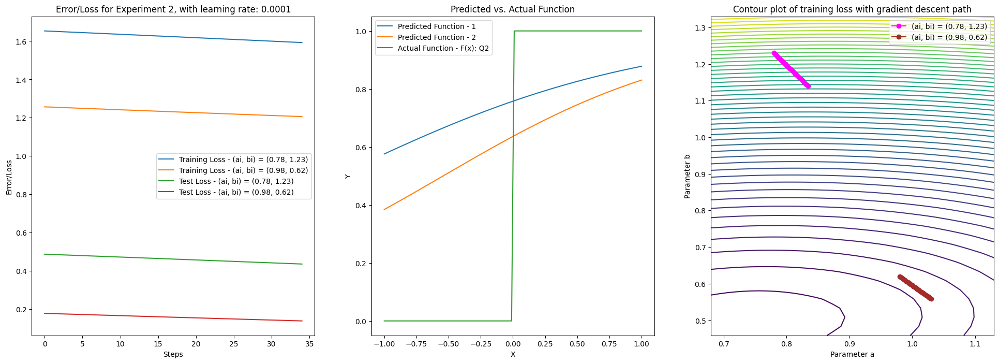

<Figure size 640x480 with 0 Axes>

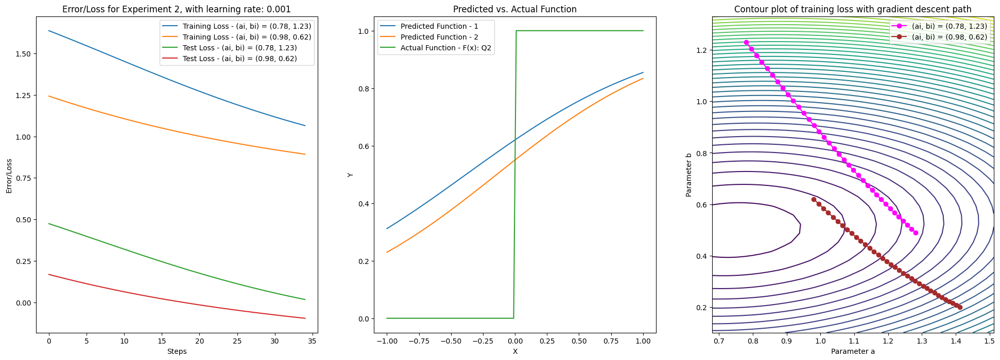

<Figure size 640x480 with 0 Axes>

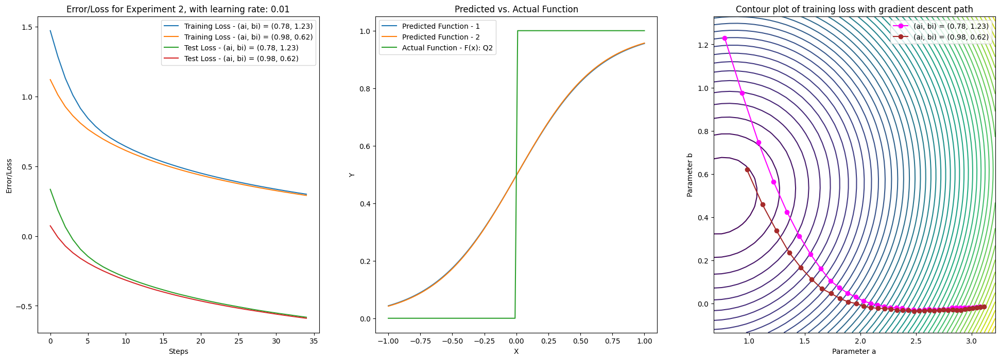

<Figure size 640x480 with 0 Axes>

In [370]:
def stochastic_descent(a0, b0, experiment, learning_rate, iterations):
    # Here is the preamble like we had in the first two q's (extract data)
    a, b = a0, b0
    x, y = experiment[0][0], experiment[0][1]
    x_test, y_test = experiment[1][0], experiment[1][1]

    # Preload arrays to return, like before 
    training_loss, test_loss = [], []
    pa, pb = [a],[b]

    for _ in range(iterations):
        indices = np.arange(len(x)) # Here we are initializing indices corresponding to point values
        np.random.shuffle(indices) # We then shuffle it according to the principles of stochastic descent

        x_s, y_s = x[indices], y[indices] # We store the indices of (x_i, y_i)

        for j in range(len(x)):
            # We convert these to np arrays to avoid error in gradient calculation (float * list)
            x_j, y_j = np.array([x_s[j]]) , np.array([y_s[j]])
            # We calculate gradients like normal
            gradA, gradB = logistic_gradient(x_j, y_j, a, b, 'a'), logistic_gradient(x_j, y_j, a, b, 'b')

            # And update like normal
            a -= learning_rate * gradA
            b -= learning_rate * gradB

        # And append like we've been doing
        training_loss.append(loss_function(sigmoid(a*x+b), y))
        test_loss.append(loss_function(sigmoid(a*x_test+b), y_test))
        pa.append(a)
        pb.append(b)

    return pa, pb, training_loss, test_loss

i = 1
for experiment in experiments:
    for rate in learning_rates:
        # Same as Q2, but we decrease iterations by 15 (as stochastic is faster)
        pa1, pb1, tr_loss1, te_loss1 = stochastic_descent(0.78, 1.23, experiment, rate*10, 35)
        pa2, pb2, tr_loss2, te_loss2 = stochastic_descent(0.98, 0.62, experiment, rate*10, 35)
        
        steps = range(35)

        # We create subplots to easily view the necessary plots for each experiment + learning rate
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns
        
        # Here we plot the various error functions against each other
        ax1.plot(steps, safe_log(tr_loss1), label='Training Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(tr_loss2), label='Training Loss - (ai, bi) = (0.98, 0.62)')
        ax1.plot(steps, safe_log(te_loss1), label='Test Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(te_loss2), label='Test Loss - (ai, bi) = (0.98, 0.62)')
        ax1.set_xlabel('Steps')
        ax1.set_ylabel('Error/Loss')
        ax1.set_title('Error/Loss for Experiment ' + str(i) + ', with learning rate: ' + str(rate))
        ax1.legend()

        # Here we plot the true function vs. our predicted function 
        x_values = np.linspace(-1, 1, 100) 
        ax2.plot(x_values, sigmoid(pa1[len(pa1)-1]*x_values + pb1[len(pb1)-1]), label='Predicted Function - 1')
        ax2.plot(x_values, sigmoid(pa2[len(pa2)-1]*x_values + pb2[len(pb2)-1]), label='Predicted Function - 2')
        ax2.plot(x_values, F2(x_values), label='Actual Function - F(x): Q2')
        ax2.set_xlabel('X')
        ax2.set_ylabel('Y')
        ax2.set_title('Predicted vs. Actual Function')
        ax2.legend()

        # To create an accurate contour grid, we will create a meshgrid that 
        # is bounded by the max and min a,b values found in all 3 experiments 
        A, B = np.meshgrid(np.linspace(min(min(pa1), min(pa2)) - 0.1, max(max(pa1), max(pa2)) + 0.1, len(pa1)), 
                   np.linspace(min(min(pb1), min(pb2)) - 0.1, max(max(pb1), max(pb2)) + 0.1, len(pa1)))

        # We find what the loss function of the experiment is to make the contour plot as a function of it
        Z = np.array([[loss_function(a_val*experiment[0][0] + b_val, experiment[0][1])
                       for a_val, b_val in zip(a_row, b_row)] 
                      for a_row, b_row in zip(A, B)])

        # To visualize our data, we plot with varying aesthetics
        ax3.contour(A, B, Z, levels=50, cmap='viridis')
        ax3.plot(pa1, pb1, color='magenta', marker='o', label='(ai, bi) = (0.78, 1.23)')
        ax3.plot(pa2, pb2, color='brown', marker='o', label='(ai, bi) = (0.98, 0.62)')
        
        plt.xlabel('Parameter a')
        plt.ylabel('Parameter b')
        plt.title('Contour plot of training loss with gradient descent path')
        plt.legend()
        plt.show()

        plt.tight_layout()
        plt.show()
    i += 1

**Nesterov Descent:**

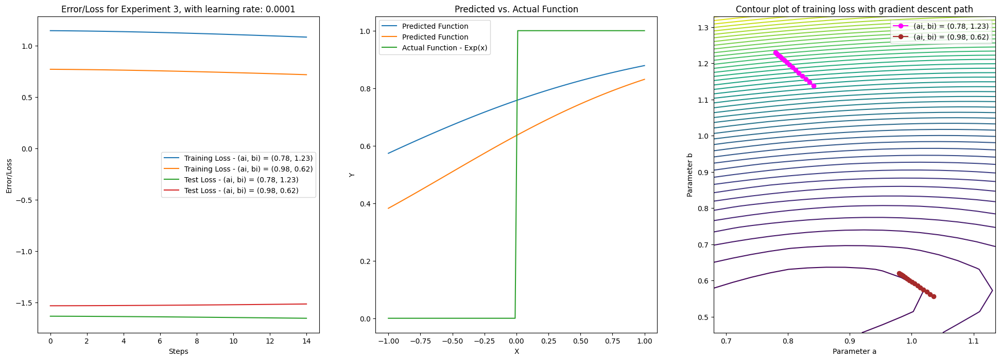

<Figure size 640x480 with 0 Axes>

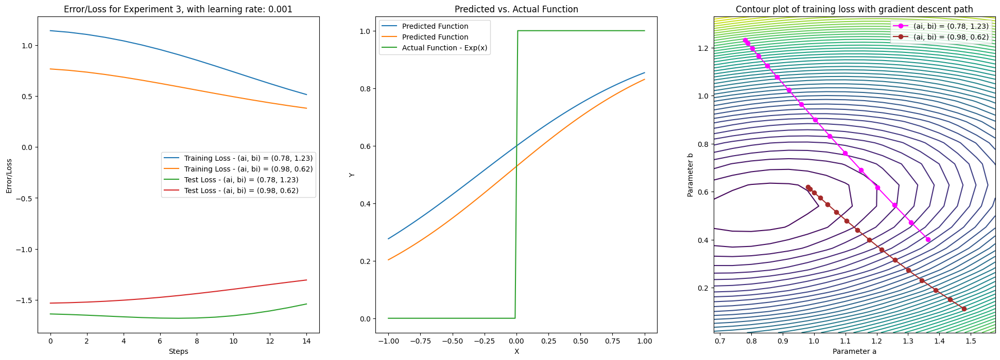

<Figure size 640x480 with 0 Axes>

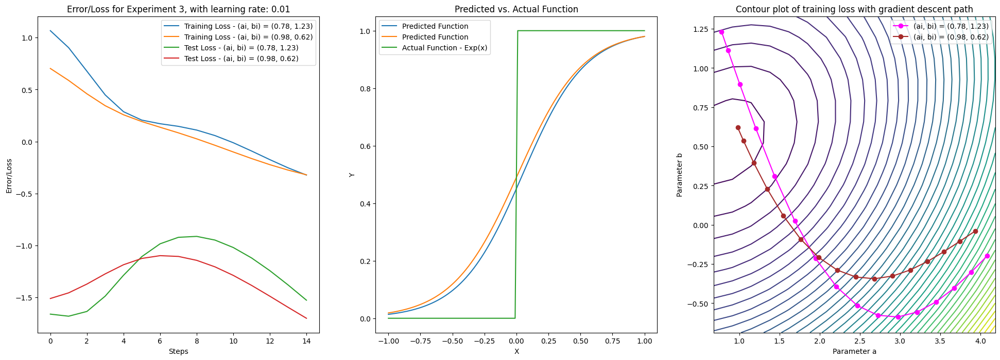

<Figure size 640x480 with 0 Axes>

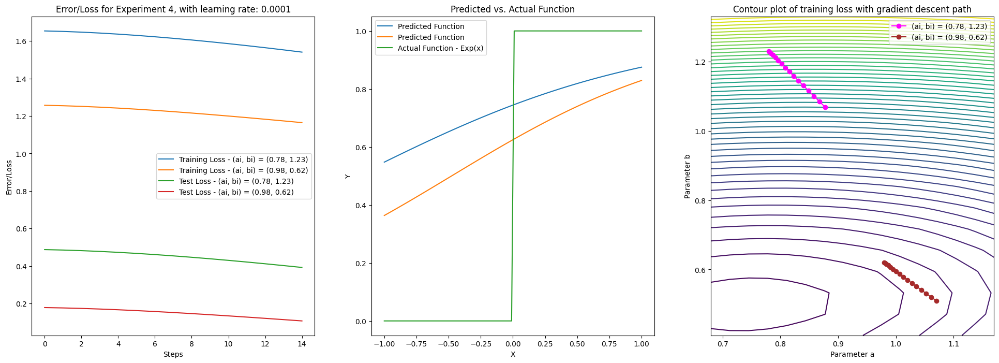

<Figure size 640x480 with 0 Axes>

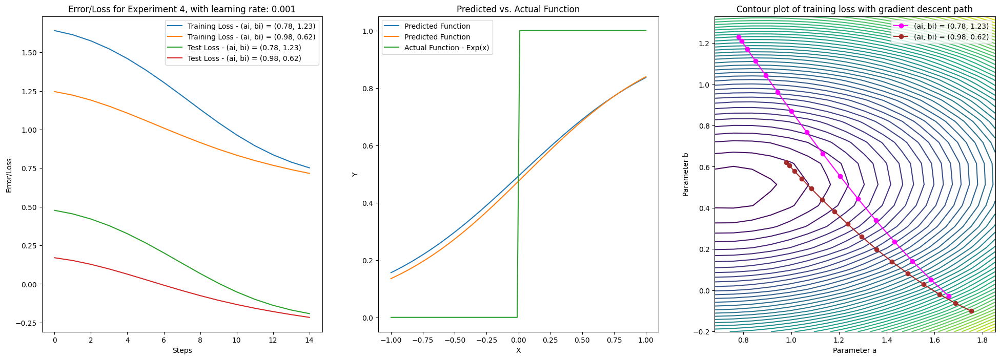

<Figure size 640x480 with 0 Axes>

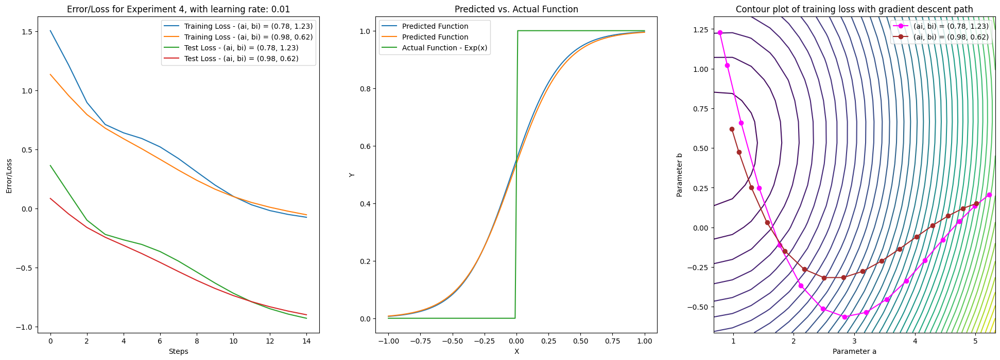

<Figure size 640x480 with 0 Axes>

In [371]:
def nesterov_descent(a0, b0, experiment, learning_rate, iterations, momentum=0.9):
    # Extract data as before
    a, b = a0, b0
    x, y = experiment[0][0], experiment[0][1]
    x_test, y_test = experiment[1][0], experiment[1][1]

    # Initialize arrays + velocities (for nestorov)
    training_loss, test_loss = [], []
    pa, pb = [a], [b]
    v_a, v_b = 0, 0

    for _ in range(iterations):

        # We "look ahead" for each parameter to use in gradient
        a_ahead, b_ahead = a - momentum * v_a, b - momentum * v_b

        # Find gradient with parameters we found by looking ahead
        gradA = logistic_gradient(x, y, a_ahead, b_ahead, 'a')
        gradB = logistic_gradient(x, y, a_ahead, b_ahead, 'b')

        # Update the velocities according to formula in class notes 
        v_a, v_b = momentum * v_a + learning_rate * gradA, momentum * v_b + learning_rate * gradB

        # And update the parameters according to the formula in class notes
        a -= v_a
        b -= v_b

        # Append the necessary errors to the given arrays
        training_loss.append(loss_function(sigmoid(a*x+b), y))
        test_loss.append(loss_function(sigmoid(a*x_test+b), y_test))
        pa.append(a)
        pb.append(b)

    return pa, pb, training_loss, test_loss

for experiment in experiments:
    for rate in learning_rates:
        # We decrease the rate slightly compared to Q2 + Stochastic
        # And we decrease iterations to 15 (down from 50 in Q2, down from 35 in Stochastic)
        pa1, pb1, tr_loss1, te_loss1 = nesterov_descent(0.78, 1.23, experiment, rate*8, 15)
        pa2, pb2, tr_loss2, te_loss2 = nesterov_descent(0.98, 0.62, experiment, rate*8, 15)
        
        steps = range(15)

        # We create subplots to easily view the necessary plots for each experiment + learning rate
        fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 8))  # 1 row, 3 columns
        
        # Here we plot the various error functions against each other
        ax1.plot(steps, safe_log(tr_loss1), label='Training Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(tr_loss2), label='Training Loss - (ai, bi) = (0.98, 0.62)')
        ax1.plot(steps, safe_log(te_loss1), label='Test Loss - (ai, bi) = (0.78, 1.23)')
        ax1.plot(steps, safe_log(te_loss2), label='Test Loss - (ai, bi) = (0.98, 0.62)')
        ax1.set_xlabel('Steps')
        ax1.set_ylabel('Error/Loss')
        ax1.set_title('Error/Loss for Experiment ' + str(i) + ', with learning rate: ' + str(rate))
        ax1.legend()

        # Here we plot the true function vs. our predicted function 
        x_values = np.linspace(-1, 1, 100) 
        ax2.plot(x_values, sigmoid(pa1[len(pa1)-1]*x_values + pb1[len(pb1)-1]), label='Predicted Function')
        ax2.plot(x_values, sigmoid(pa2[len(pa2)-1]*x_values + pb2[len(pb2)-1]), label='Predicted Function')
        ax2.plot(x_values, F2(x_values), label='Actual Function - Exp(x)')
        ax2.set_xlabel('X')
        ax2.set_ylabel('Y')
        ax2.set_title('Predicted vs. Actual Function')
        ax2.legend()

        # To create an accurate contour grid, we will create a meshgrid that 
        # is bounded by the max and min a,b values found in all 3 experiments 
        A, B = np.meshgrid(np.linspace(min(min(pa1), min(pa2)) - 0.1, max(max(pa1), max(pa2)) + 0.1, len(pa1)), 
                   np.linspace(min(min(pb1), min(pb2)) - 0.1, max(max(pb1), max(pb2)) + 0.1, len(pa1)))

        # We find what the loss function of the experiment is to make the contour plot as a function of it
        Z = np.array([[loss_function(a_val*experiment[0][0] + b_val, experiment[0][1])
                       for a_val, b_val in zip(a_row, b_row)] 
                      for a_row, b_row in zip(A, B)])

        # To visualize our data, we plot with varying aesthetics
        ax3.contour(A, B, Z, levels=50, cmap='viridis')
        ax3.plot(pa1, pb1, color='magenta', marker='o', label='(ai, bi) = (0.78, 1.23)')
        ax3.plot(pa2, pb2, color='brown', marker='o', label='(ai, bi) = (0.98, 0.62)')
        
        plt.xlabel('Parameter a')
        plt.ylabel('Parameter b')
        plt.title('Contour plot of training loss with gradient descent path')
        plt.legend()
        plt.show()

        plt.tight_layout()
        plt.show()
    i += 1

**<u>Discussion:</u>** <br> Here, we notice that stochastic is slightly faster than the plain gradient descent for logistic regression, achieving a similar result (both in terms of approximation and errro) but in a shorter window ((plain) 50 -> 35 iterations (stochastic)). However, we see that the nesterov is significantly faster, reaching a more accurate approximation with far less error in a significantly shorter window of time (and even smaller learning rate). That said, there is clearly a potential drawback with nesterov, which can be seen in the contour plot. It does not neatly converge towards a single direction along with the other initial point (like in the other variants of descent), so one could imagine that stopping somewhere too early or with incorrect parameters could lead to a slightly worse outcome than stochastic or even plain descent, if these aren't considered when defining our hyperparameters. (Note: we still suffer from infinite convergence as I have not changed the function and am still using least squares (as per the assignment), even though other error functions might be better for the provided function due to its flat nature at 0.)

4. Implement the 2-layer neural network <br>
$f(x) = c_1σ(a_1x + b_1) + . . . c_nσ(a_nx + b_n) + b,$ <br>
with the following target functions: <br>
$F(x) = sin 30x + cos 27x, F(x) = sin (\frac{1}{1.02−x})$ <br>
and in addition, a function of your choice. For each of these 3 functions, perform experiments
varying the following. <br>
• Hidden layer width n. Naturally, we want this to be as small as possible. <br>
• Activation function σ. You may introduce a third option, in addition to the logistic and ReLU. <br>
• Training method: Gradient descent variant, with additional strategies and parameters associated with it, such as the learning rate schedule. <br>
• The training data size N. Naturally, we want this to be as small as possible.<br>
You do not have to include every combination of strategies you have tried in the final submission, but report your final conclusions and observations you find interesting, backed up by some illustrative examples and plots. You can do reading on your own and bring in different strategies to try. The final goal to have in mind is to identify what works best for each of the 3 functions.

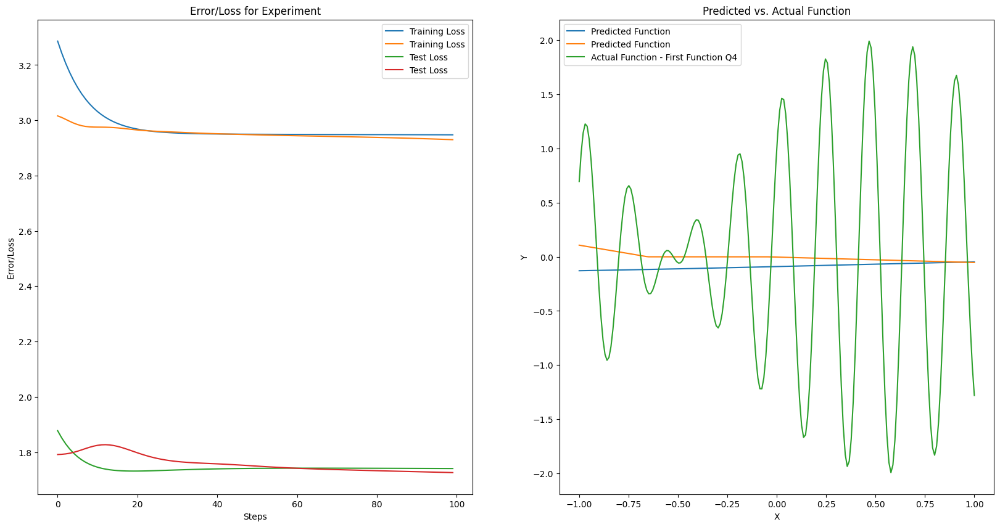

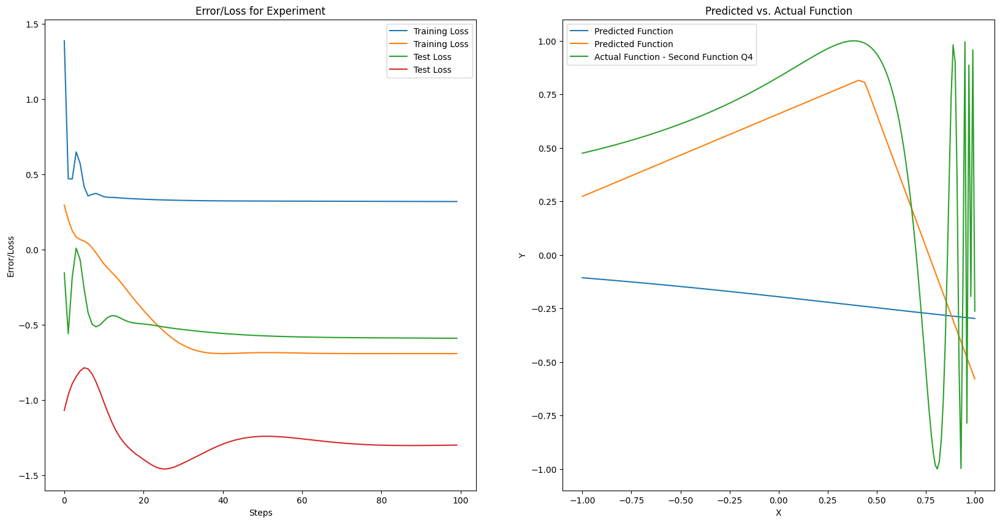

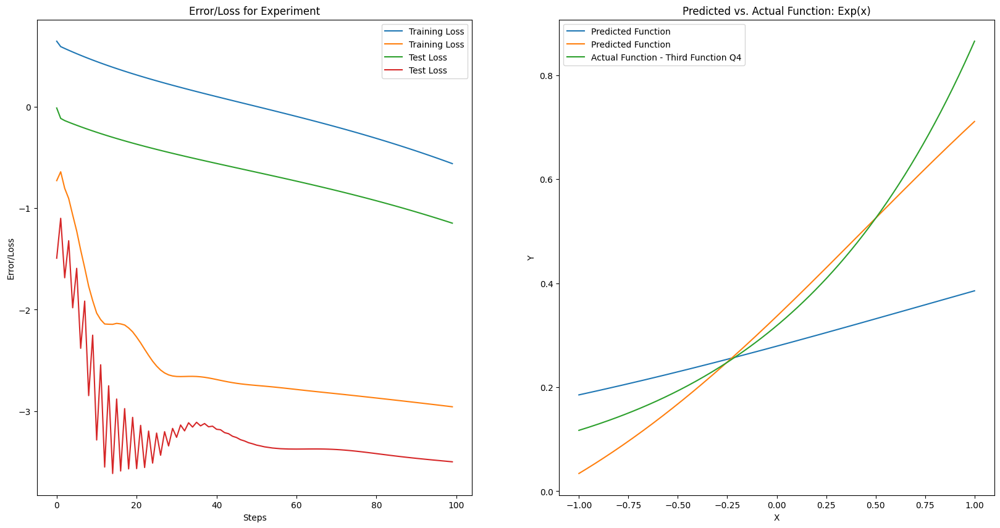

In [372]:
def rectifier(x): # Rectifier function 
    return (x + np.abs(x))/2

def sigmoidD(x): # Derivative of Sigmoid (defined in class)
    sigm = sigmoid(x)
    return sigm*(1-sigm)

def rectifierD(x): # Derivative of rectifier function (simplified)
    return (x > 0).astype(float)
    
def adjustLearningRate(cur, epoch): # Learning rate decay
    return (cur * (1/(1+0.01*epoch)))

def takeGradients(a, b, c, bias, x, y, sigma, sigmaD):
    eq = getEquation(a, b, c, x, sigma) + bias # This is our z_k (defined in lecture 22 and in the question) 

    a_new, b_new, c_new = [], [], [] # These will be our updated parameters
    for i in range(len(a)):
        a_new.append(np.sum((eq-y) * c[i] * sigmaD(a[i] * x + b[i]) * x)) # Derivative w.r.t. a given a_i 
        b_new.append(np.sum((eq-y) * c[i] * sigmaD(a[i] * x + b[i]))) # Derivative w.r.t. a given b_i
        c_new.append(np.sum((eq-y) * sigma(a[i] * x + b[i]))) # Derivative w.r.t. a given c_i
    bias_new = np.sum(eq - y) # Derivative of bias (i.e. + b)
    
    return a_new, b_new, c_new, bias_new

def getEquation(a, b, c, x, sigma):
    result = 0 # This just calculates f(x) defined in Q4, but without additional b
    
    for i in range(len(a)):
        result += (c[i] * sigma(a[i] * x + b[i]))
    
    return result

def updateByPlain(a, b, c, bias, x, y, sigm, rate):
    # Determines which activation derivative to use
    sigmD = sigmoidD if sigm == sigmoid else rectifierD
    # These are our calculated gradients
    a_new, b_new, c_new, bias_new = takeGradients(a, b, c, bias, x, y, sigm, sigmD)
    
    for i in range(len(a_new)):
        # Update all parameters using calculated gradients
        a[i] -= rate * a_new[i]
        b[i] -= rate * b_new[i]
        c[i] -= rate * c_new[i]
    bias -= rate * bias_new
  
    return a, b, c, bias

def updateByNesterov(a, b, c, bias, x, y, sigm, rate, v_a, v_b, v_c, v_bias, momentum=0.9):
    # Determines which activation derivative to use
    sigmD = sigmoidD if sigm == sigmoid else rectifierD

    # Lookahead for all parameters (array - scalar*array)
    a_ahead = a - momentum * np.array(v_a)
    b_ahead = b - momentum * np.array(v_b)
    c_ahead = c - momentum * np.array(v_c)
    bias_ahead = bias - momentum * v_bias

    # Calculates gradients using all "look ahead" function
    a_grad, b_grad, c_grad, bias_grad = takeGradients(a_ahead, b_ahead, c_ahead, bias_ahead, x, y, sigm, sigmD)

    # Updates all velocities (one for each parameter) according to formula
    v_a = [momentum * v_a[i] + rate * a_grad[i] for i in range(len(a))]
    v_b = [momentum * v_b[i] + rate * b_grad[i] for i in range(len(b))]
    v_c = [momentum * v_c[i] + rate * c_grad[i] for i in range(len(c))]
    v_bias = momentum * v_bias + rate * bias_grad

    # Updates all parameters (need to convert to np.array to avoid error (float * list))
    a -= np.array(v_a)
    b -= np.array(v_b)
    c -= np.array(v_c)
    bias -= v_bias
    
    return a, b, c, bias, v_a, v_b, v_c, v_bias

def trainNetwork(sigm, epochs, mode, rate, n, F, x_values, x_values_test):
    # Initialize all our hyperparameters 
    x, y = x_values, DataSet(F, x_values, np.random.uniform(0, 1e-4, len(x_values)))
    x_test, y_test = x_values_test, DataSet(F, x_values_test, np.random.uniform(0, 1e-4, len(x_values_test)))
    a, b, c = np.random.uniform(-1, 1, n), np.random.uniform(-1, 1, n), np.random.uniform(-1, 1, n)
    # We choose a small non-zero value for initial bias
    bias = 1e-4

    # We initialize all velocities to 0 (as recommended)
    v_a, v_b, v_c, v_bias = [0] * len(a), [0] * len(b), [0] * len(c), 0

    # Initializes error arrays
    training_error, test_error = [], [] 

    for epoch in range(epochs):

        # We update according to plain descent rules
        if (mode == "plain"):
            a, b, c, bias = updateByPlain(a, b, c, bias, x, y, sigm, rate)

        # Or we update according to nesterov descent rules
        if (mode == "nesterov"):
            a, b, c, bias, v_a, v_b, v_c, v_bias = updateByNesterov(a, b, c, bias, x, y, sigm, rate, v_a, v_b, v_c, v_bias)

        # Calculates training error 
        network_output_train = getEquation(a, b, c, x, sigm) + bias
        training_error.append(loss_function(network_output_train, y))

        # Calculates test error
        network_output_test = getEquation(a, b, c, x_test, sigm) + bias
        test_error.append(loss_function(network_output_test, y_test))

        # We decay the error after each epoch
        adjustLearningRate(rate, epoch)

    return a, b, c, bias, training_error, test_error

# Below we generate x values for all of our experiments
np.random.seed(849) # We set a seed for reproducibility (to help isolate certain features)
x1, x2, x3 = np.random.uniform(-1, 1, 20), np.random.uniform(-1, 1, 40), np.random.uniform(-1, 1, 60)
xt1, xt2, xt3 = np.random.uniform(-1, 1, 5), np.random.uniform(-1, 1, 8), np.random.uniform(-1, 1, 15)

# And we train network with certain parameters to highlight certain features in discussion
# I experimented with different seeds and parameters to come to my conclusions
a0, b0, c0, bias0, terror0, testr0 = trainNetwork(sigmoid, 100, "plain", 0.001, 4, F3, x2, xt2)
a1, b1, c1, bias1, terror1, testr1 = trainNetwork(rectifier, 100, "nesterov", 0.001, 2, F3, x2, xt2)

np.random.seed(794)
x1, x2, x3 = np.random.uniform(-1, 1, 20), np.random.uniform(-1, 1, 40), np.random.uniform(-1, 1, 60)
xt1, xt2, xt3 = np.random.uniform(-1, 1, 5), np.random.uniform(-1, 1, 8), np.random.uniform(-1, 1, 15)

a2, b2, c2, bias2, terror2, testr2 = trainNetwork(sigmoid, 100, "nesterov", 0.0125, 2, F4, x1, xt1)
a3, b3, c3, bias3, terror3, testr3 = trainNetwork(rectifier, 100, "nesterov", 0.0125, 4, F4, x1, xt1)

np.random.seed(741)
x1, x2, x3 = np.random.uniform(-1, 1, 20), np.random.uniform(-1, 1, 40), np.random.uniform(-1, 1, 60)
xt1, xt2, xt3 = np.random.uniform(-1, 1, 5), np.random.uniform(-1, 1, 8), np.random.uniform(-1, 1, 15)

a4, b4, c4, bias4, terror4, testr4 = trainNetwork(sigmoid, 100, "plain", 0.01, 2, F5, x3, xt3)
a5, b5, c5, bias5, terror5, testr5 = trainNetwork(sigmoid, 100, "nesterov", 0.01, 4, F5, x3, xt3)

 # We create subplots to easily view the necessary plots for each experiment + learning rate
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))  # 1 row, 2 columns

steps = range(100)
# Here we plot the various error functions against each other
ax1.plot(steps, safe_log(terror0), label='Training Loss')
ax1.plot(steps, safe_log(terror1), label='Training Loss')
ax1.plot(steps, safe_log(testr0), label='Test Loss')
ax1.plot(steps, safe_log(testr1), label='Test Loss')
ax1.set_xlabel('Steps')
ax1.set_ylabel('Error/Loss')
ax1.set_title('Error/Loss for Experiment')
ax1.legend()

# Here we plot the true function vs. our predicted function 
x_values = np.linspace(-1, 1, 200) 
ax2.plot(x_values, getEquation(a0, b0, c0, x_values, sigmoid), label='Predicted Function')
ax2.plot(x_values, getEquation(a1, b1, c1, x_values, rectifier), label='Predicted Function')
ax2.plot(x_values, F3(x_values), label='Actual Function - First Function Q4')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Predicted vs. Actual Function')
ax2.legend()

 # We create subplots to easily view the necessary plots for each experiment + learning rate
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))  # 1 row, 2 columns
steps = range(100)
# Here we plot the various error functions against each other
ax1.plot(steps, safe_log(terror2), label='Training Loss')
ax1.plot(steps, safe_log(terror3), label='Training Loss')
ax1.plot(steps, safe_log(testr2), label='Test Loss')
ax1.plot(steps, safe_log(testr3), label='Test Loss')
ax1.set_xlabel('Steps')
ax1.set_ylabel('Error/Loss')
ax1.set_title('Error/Loss for Experiment')
ax1.legend()

# Here we plot the true function vs. our predicted function 
x_values = np.linspace(-1, 1, 200) 
ax2.plot(x_values, getEquation(a2, b2, c2, x_values, sigmoid), label='Predicted Function')
ax2.plot(x_values, getEquation(a3, b3, c3, x_values, rectifier), label='Predicted Function')
ax2.plot(x_values, F4(x_values), label='Actual Function - Second Function Q4')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Predicted vs. Actual Function')
ax2.legend()

 # We create subplots to easily view the necessary plots for each experiment + learning rate
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))  # 1 row, 2 columns
steps = range(100)
# Here we plot the various error functions against each other
ax1.plot(steps, safe_log(terror4), label='Training Loss')
ax1.plot(steps, safe_log(terror5), label='Training Loss')
ax1.plot(steps, safe_log(testr4), label='Test Loss')
ax1.plot(steps, safe_log(testr5), label='Test Loss')
ax1.set_xlabel('Steps')
ax1.set_ylabel('Error/Loss')
ax1.set_title('Error/Loss for Experiment')
ax1.legend()

# Here we plot the true function vs. our predicted function 
x_values = np.linspace(-1, 1, 200) 
ax2.plot(x_values, getEquation(a4, b4, c4, x_values, sigmoid), label='Predicted Function')
ax2.plot(x_values, getEquation(a5, b5, c5, x_values, sigmoid), label='Predicted Function')
ax2.plot(x_values, F5(x_values), label='Actual Function - Third Function Q4')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Predicted vs. Actual Function: Exp(x)')
ax2.legend()

**<u>Discussion:</u>** <br>
**1.** $F(x) = sin30x + cos27x$: For this function, I found that the choice of activation function did not have that great of an effect, although the rectifier function did appear to perform better more often. This could likely be explained by the fact that the function is fairly symmetric across the interval, with greater peaks occurring in the positive half. As for the width of neurons, I did not notice anything too dramatic, although it does seem like the nesterov gradient reached a lower error faster for smaller number of neurons (likewise, not substantially faster for n >>). The variable that seemed to make the most difference for this function was the nesterov vs. the plain. The nesterov was consistently performing better than the plain, in terms of how quickly it plateaus in error. This is expected given that the nesterov is expected to be faster than the plain, by design. <br>
<br>
**2.** $F(x) = sin \frac{1}{1.02-x}$: For this function, I noticed that the choice of activation function seemed more relevant than the former function. Specifically, the rectifier appeared to be better at modeling this function, likely because of the density found exclusively in the positive half of the interval. I also noticed that we prefer nesterov (again), however with a preference towards fewer neurons here. This is likely because we want to avoid overfitting the data (which again is quite dense at the end of the interval).

**3.** $F(x) = \pi * log(x)$: For this function, the sigmoid function performed better than the rectifier. Likely because all y-values are positive and there is no oscillation like the other two functions. Likewise, I noticed that we want a moderate amount of neurons. That is, more than the second function, but not too many where convergence is missed. Since, we aren't running the risk of overfitting, like in function 2, this makes sense. Of course, nesterov is also better here as well. 

For all 3 functions, I found that a bigger data set resulted in a better approximation. That said, we don't want the data set too big (i.e. >1000), as I found that there was a large amount of error when reaching towards that. Finally, it's important to note that the starting parameters absolutely matter. I was not able to find the optimal parameters for all combinations, so I settled for decent points that could simply highlight what was necessary. But notice, that the better the parameter initialization was, the more accurate the approximation and the less error we had. 